In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import timedelta

In [2]:
df_gbg = pd.read_pickle('../Dataframes/df_daily_temp_gbg.pkl')

In [3]:
df_gbg

,Datum,Kvalitet,Snittemperatur,Year,Month
0,1961-01-01,G,1.07,1961,1
1,1961-01-02,G,2.27,1961,1
2,1961-01-03,G,2.27,1961,1
3,1961-01-04,G,2.53,1961,1
4,1961-01-05,G,2.13,1961,1
...,...,...,...,...,...
19909,2023-06-27,G,18.18,2023,6
19910,2023-06-28,G,19.72,2023,6
19911,2023-06-29,G,19.22,2023,6
19912,2023-06-30,G,17.40,2023,6


In [4]:
df_save = pd.read_pickle('../Dataframes/df_daily_temp_save.pkl')

In [5]:
df_save

,Datum,Kvalitet,Snittemperatur,Year,Month
0,1944-01-01,G,3.20,1944,1
1,1944-01-02,G,3.60,1944,1
2,1944-01-03,G,2.80,1944,1
3,1944-01-04,G,-4.47,1944,1
4,1944-01-05,G,-1.40,1944,1
...,...,...,...,...,...
22980,2006-12-01,Y,8.03,2006,12
22981,2006-12-02,Y,8.81,2006,12
22982,2006-12-03,Y,8.11,2006,12
22983,2006-12-04,Y,8.57,2006,12


In [6]:
# Add quarter column to df_gbg
df_gbg['Quarter'] = 0
for ind, val in df_gbg.iterrows():
    month = val['Month']
    if 1 <= month <=3:
        df_gbg['Quarter'][ind] = 1
        pass
    elif 4 <= month <= 6:
        df_gbg['Quarter'][ind] = 2
        pass
    elif 7 <= month <= 9:
        df_gbg['Quarter'][ind] = 3
        pass
    else:
        df_gbg['Quarter'][ind] = 4

C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppD

In [7]:
# Add quarter column to df_save
df_save['Quarter'] = 0
for ind, val in df_save.iterrows():
    month = val['Month']
    if 1 <= month <=3:
        df_save['Quarter'][ind] = 1
        pass
    elif 4 <= month <= 6:
        df_save['Quarter'][ind] = 2
        pass
    elif 7 <= month <= 9:
        df_save['Quarter'][ind] = 3
        pass
    else:
        df_save['Quarter'][ind] = 4

C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\2836094441.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\2836094441.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\2836094441.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\A

In [8]:
df_merged_temp_com = pd.merge(df_gbg, df_save[['Datum', 'Snittemperatur']], on='Datum', suffixes=('_GBG', '_save'))

In [9]:
df_merged_temp_com['Diff'] = df_merged_temp_com['Snittemperatur_GBG'] - df_merged_temp_com['Snittemperatur_save'].round(2)

In [10]:
# Diff shows how much warmer GBG was than Säve. If negative, GBG was colder
df_merged_temp_com

,Datum,Kvalitet,Snittemperatur_GBG,Year,Month,Quarter,Snittemperatur_save,Diff
0,1961-01-01,G,1.07,1961,1,1,0.36,0.71
1,1961-01-02,G,2.27,1961,1,1,1.64,0.63
2,1961-01-03,G,2.27,1961,1,1,1.57,0.70
3,1961-01-04,G,2.53,1961,1,1,1.38,1.15
4,1961-01-05,G,2.13,1961,1,1,1.17,0.96
...,...,...,...,...,...,...,...,...
13887,2006-12-01,Y,8.35,2006,12,4,8.03,0.32
13888,2006-12-02,Y,9.10,2006,12,4,8.81,0.29
13889,2006-12-03,Y,8.50,2006,12,4,8.11,0.39
13890,2006-12-04,Y,8.99,2006,12,4,8.57,0.42


In [11]:
avg_diff = df_merged_temp_com['Diff'].mean()
avg_diff

0.8849964008062193

In [12]:
temp_per_month = df_merged_temp_com['Diff'].groupby(df_merged_temp_com['Month']).mean()
temp_per_month.round(2).value_counts().unique

<bound method Series.unique of Diff
0.67    2
1.16    2
0.76    1
0.86    1
0.96    1
1.14    1
1.06    1
0.82    1
0.70    1
0.66    1
Name: count, dtype: int64>

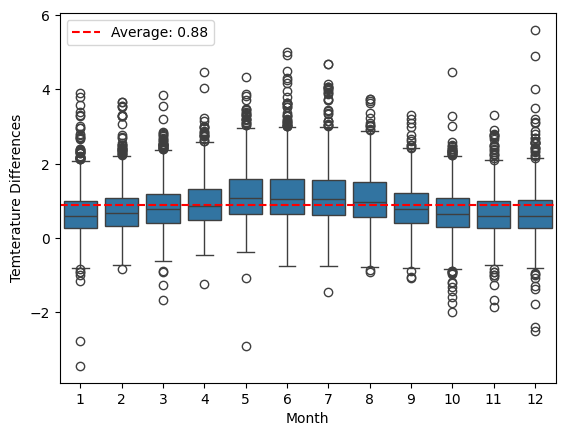

In [13]:
plt.figure()
graph = sns.boxplot(df_merged_temp_com, x=df_merged_temp_com['Month'], y=df_merged_temp_com['Diff'])
graph.axhline(avg_diff, color='r', linestyle='--', label=f'Average: {avg_diff.round(2)}')
graph.legend()
plt.ylabel('Temterature Differences')
plt.show()

In [14]:
df_merged_temp_com['Monthly_diff'] = 0
for ind, val in df_merged_temp_com.iterrows():
    month_no = val['Month']
    df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)


C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3325996231.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3325996231.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.67' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)


In [15]:
df_merged_temp_com['Monthly_diff'].value_counts()

Monthly_diff
0.67    2330
1.16    2247
0.86    1202
1.06    1194
0.96    1185
0.70    1178
1.14    1172
0.82    1170
0.66    1140
0.76    1074
Name: count, dtype: int64

Get the compiled dataframe, and adjust temperatures

In [16]:
df_gbg_save = pd.read_pickle('../Dataframes/df_compiled_daily_temp_gbg_save.pkl')

In [17]:
df_gbg_save_adjusted = df_gbg_save.copy()

In [18]:
date_to_start = pd.to_datetime('2006-12-06')
for ind, val in df_gbg_save_adjusted.iterrows():
    if val['Datum'] > date_to_start:
        month = val['Month']
        new_temp = val['Snittemperatur'] - temp_per_month[month]
        df_gbg_save_adjusted['Snittemperatur'][ind] = new_temp
    else:
        pass


C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\223022434.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg_save_adjusted['Snittemperatur'][ind] = new_temp
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\223022434.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg_save_adjusted['Snittemperatur'][ind] = new_temp
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\223022434.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

In [19]:
df_gbg_save_adjusted['Snittemperatur'] = df_gbg_save_adjusted['Snittemperatur'].round(2)
df_gbg_save_adjusted['day_of_year'] = df_gbg_save_adjusted['Datum'].dt.day_of_year

In [20]:
df_gbg_save_adjusted['Over_10_5_days_in_a_row'] = 0
df_gbg_save_adjusted['0_or_under_5_days_in_a_row'] = 0

In [21]:
df_gbg_save_adjusted

,Datum,Kvalitet,Snittemperatur,Year,Month,day_of_year,Over_10_5_days_in_a_row,0_or_under_5_days_in_a_row
0,1944-01-01,G,3.20,1944,1,1,0,0
1,1944-01-02,G,3.60,1944,1,2,0,0
2,1944-01-03,G,2.80,1944,1,3,0,0
3,1944-01-04,G,-4.47,1944,1,4,0,0
4,1944-01-05,G,-1.40,1944,1,5,0,0
...,...,...,...,...,...,...,...,...
29002,2023-06-27,G,17.02,2023,6,178,0,0
29003,2023-06-28,G,18.56,2023,6,179,0,0
29004,2023-06-29,G,18.06,2023,6,180,0,0
29005,2023-06-30,G,16.24,2023,6,181,0,0


In [22]:
counter = 0

for i in range(1, len(df_gbg_save_adjusted)):
    if df_gbg_save_adjusted['Snittemperatur'].iloc[i] >= 10:
        counter += 1
    else:
        counter = 0
        pass
    if counter == 5:
        df_gbg_save_adjusted['Over_10_5_days_in_a_row'].iloc[i] = 1
        counter = 0
    else:
        pass


C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3455739263.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg_save_adjusted['Over_10_5_days_in_a_row'].iloc[i] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3455739263.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg_save_adjusted['Over_10_5_days_in_a_row'].iloc[i] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3455739263.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-

In [23]:
counter = 0

for i in range(1, len(df_gbg_save_adjusted)):
    if df_gbg_save_adjusted['Snittemperatur'].iloc[i] <= 0:
        counter += 1
    else:
        counter = 0
        pass
    if counter == 5:
        df_gbg_save_adjusted['0_or_under_5_days_in_a_row'].iloc[i] = 1
        counter = 0
    else:
        pass


C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3587449066.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg_save_adjusted['0_or_under_5_days_in_a_row'].iloc[i] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3587449066.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg_save_adjusted['0_or_under_5_days_in_a_row'].iloc[i] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_18972\3587449066.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#retu

In [24]:
# df_gbg_save_adjusted.to_pickle('../Dataframes/df_compiled_adjusted_daily_temp_gbg_save.pkl')
# df_gbg_save_adjusted.to_csv('../data/prepared_data/compiled_adjusted_daily_temp_data.csv', index=False, mode='w')